# Analyzing 'final_dataset.csv'

## Importing dataset and modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('../../Datasets/final_dataset.csv')

In [3]:
df.head()

,IMPACT,SUBSTANCE,APPROPRIATENESS,SOUNDNESS_CORRECTNESS,ORIGINALITY,RECOMMENDATION,CLARITY,REVIEWER_CONFIDENCE,comments,strengths,...,sentence_complexity,technical_depth,total_word_count,strength_word_count,weakness_word_count,discussion_word_count,normalized_length,unique_key_points,information_density,unique_insights_per_word
0,0.6,0.8,1.0,0.8,0.6,0.6,0.6,0.6,- Strengths:\n* Outperforms ALIGN in supervise...,* Outperforms ALIGN in supervised entity linki...,...,12,3.695000,230,56,167,0,0.544987,3,0.013043,0.004064
1,0.6,0.8,1.0,0.8,0.6,0.8,0.6,0.8,This paper addresses the problem of disambigua...,NaN,...,37,1.396757,724,0,0,0,1.715525,7,0.009669,0.001304
2,0.6,0.8,0.8,0.8,0.6,0.8,0.6,0.8,"- Strengths:\nGood ideas, simple neural learni...","Good ideas, simple neural learning, interestin...",...,23,2.533913,303,16,0,0,0.717961,3,0.009901,0.003142
3,0.6,0.8,1.0,0.8,0.6,0.6,1.0,0.8,- Strengths:\nThe idea of hard monotonic atten...,The idea of hard monotonic attention is new an...,...,12,3.872500,199,13,46,133,0.471532,2,0.010050,0.004509
4,0.6,0.8,1.0,0.8,0.6,0.6,1.0,0.6,- Strengths: A new encoder-decoder model is pr...,NaN,...,55,1.008000,887,0,0,848,2.101755,9,0.010147,0.001089


In [4]:
df.columns

Index(['IMPACT', 'SUBSTANCE', 'APPROPRIATENESS', 'SOUNDNESS_CORRECTNESS',
       'ORIGINALITY', 'RECOMMENDATION', 'CLARITY', 'REVIEWER_CONFIDENCE',
       'comments', 'strengths', 'weaknesses', 'general_discussion',
       'content_relevance', 'evidence_support', 'strength_argument_score',
       'weakness_argument_score', 'argument_strength', 'readability_index',
       'sentence_complexity', 'technical_depth', 'total_word_count',
       'strength_word_count', 'weakness_word_count', 'discussion_word_count',
       'normalized_length', 'unique_key_points', 'information_density',
       'unique_insights_per_word'],
      dtype='object')

## Preprocessing

In [5]:
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
IMPACT                        6
SUBSTANCE                     0
APPROPRIATENESS               0
SOUNDNESS_CORRECTNESS         0
ORIGINALITY                   0
RECOMMENDATION                0
CLARITY                       0
REVIEWER_CONFIDENCE           0
comments                      0
strengths                   111
weaknesses                  111
general_discussion          122
content_relevance             0
evidence_support              0
strength_argument_score       0
weakness_argument_score       0
argument_strength             0
readability_index             0
sentence_complexity           0
technical_depth               0
total_word_count              0
strength_word_count           0
weakness_word_count           0
discussion_word_count         0
normalized_length             0
unique_key_points             0
information_density           0
unique_insights_per_word      0
dtype: int64


In [6]:
numerical_columns = ['IMPACT', 'SUBSTANCE', 'APPROPRIATENESS', 'SOUNDNESS_CORRECTNESS',
       'ORIGINALITY', 'RECOMMENDATION', 'CLARITY', 'REVIEWER_CONFIDENCE',
       'content_relevance', 'evidence_support', 'strength_argument_score',
       'weakness_argument_score', 'argument_strength', 'readability_index',
       'sentence_complexity', 'technical_depth', 'total_word_count',
       'strength_word_count', 'weakness_word_count', 'discussion_word_count',
       'normalized_length', 'unique_key_points', 'information_density',
       'unique_insights_per_word']

for col in numerical_columns:
    df[col].fillna(df[col].median(), inplace=True)

In [7]:
text_columns = ['strengths', 'weaknesses', 'general_discussion', 'comments']
for col in text_columns:
    df[col].fillna("No information available", inplace=True)

In [8]:
missing_values = df.isnull().sum()
print(missing_values)

IMPACT                      0
SUBSTANCE                   0
APPROPRIATENESS             0
SOUNDNESS_CORRECTNESS       0
ORIGINALITY                 0
RECOMMENDATION              0
CLARITY                     0
REVIEWER_CONFIDENCE         0
comments                    0
strengths                   0
weaknesses                  0
general_discussion          0
content_relevance           0
evidence_support            0
strength_argument_score     0
weakness_argument_score     0
argument_strength           0
readability_index           0
sentence_complexity         0
technical_depth             0
total_word_count            0
strength_word_count         0
weakness_word_count         0
discussion_word_count       0
normalized_length           0
unique_key_points           0
information_density         0
unique_insights_per_word    0
dtype: int64


In [9]:
print("Basic Statistics of the Dataset:")
print(df.describe())

Basic Statistics of the Dataset:
           IMPACT   SUBSTANCE  APPROPRIATENESS  SOUNDNESS_CORRECTNESS  \
count  248.000000  248.000000       248.000000             248.000000   
mean     0.638710    0.713710         0.968548               0.804032   
std      0.109994    0.168266         0.092528               0.183929   
min      0.400000    0.200000         0.400000               0.400000   
25%      0.600000    0.600000         1.000000               0.600000   
50%      0.600000    0.800000         1.000000               0.800000   
75%      0.600000    0.800000         1.000000               1.000000   
max      1.000000    1.000000         1.000000               1.000000   

       ORIGINALITY  RECOMMENDATION     CLARITY  REVIEWER_CONFIDENCE  \
count   248.000000      248.000000  248.000000           248.000000   
mean      0.770161        0.666129    0.792742             0.775806   
std       0.172376        0.180367    0.180271             0.148608   
min       0.400000       

## Quantitative Analysis

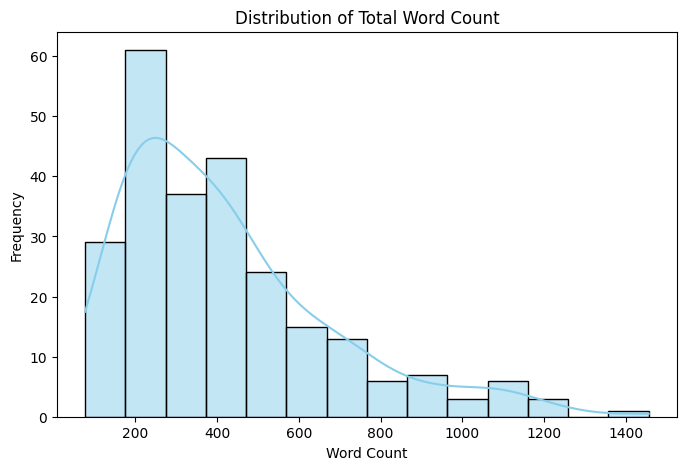

In [79]:
plt.figure(figsize=(8, 5))
sns.histplot(df['total_word_count'], kde=True, color='skyblue')
plt.title('Distribution of Total Word Count')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.show()

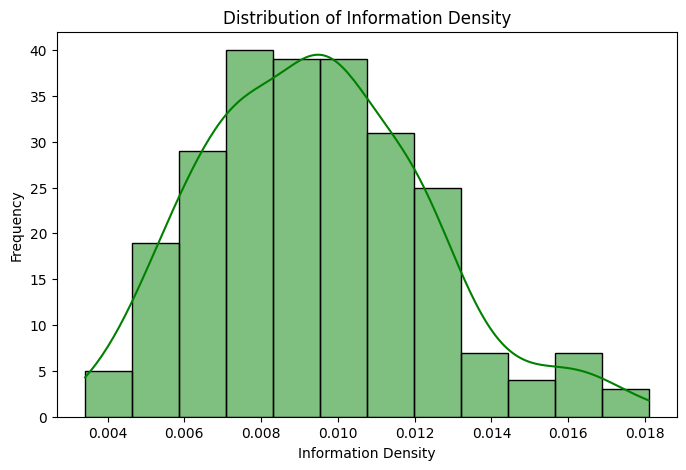

In [80]:
plt.figure(figsize=(8, 5))
sns.histplot(df['information_density'], kde=True, color='green')
plt.title('Distribution of Information Density')
plt.xlabel('Information Density')
plt.ylabel('Frequency')
plt.show()

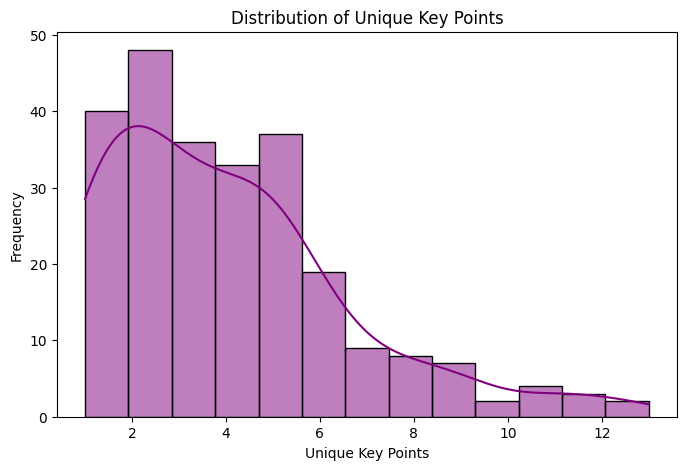

In [81]:
plt.figure(figsize=(8, 5))
sns.histplot(df['unique_key_points'], kde=True, color='purple')
plt.title('Distribution of Unique Key Points')
plt.xlabel('Unique Key Points')
plt.ylabel('Frequency')
plt.show()

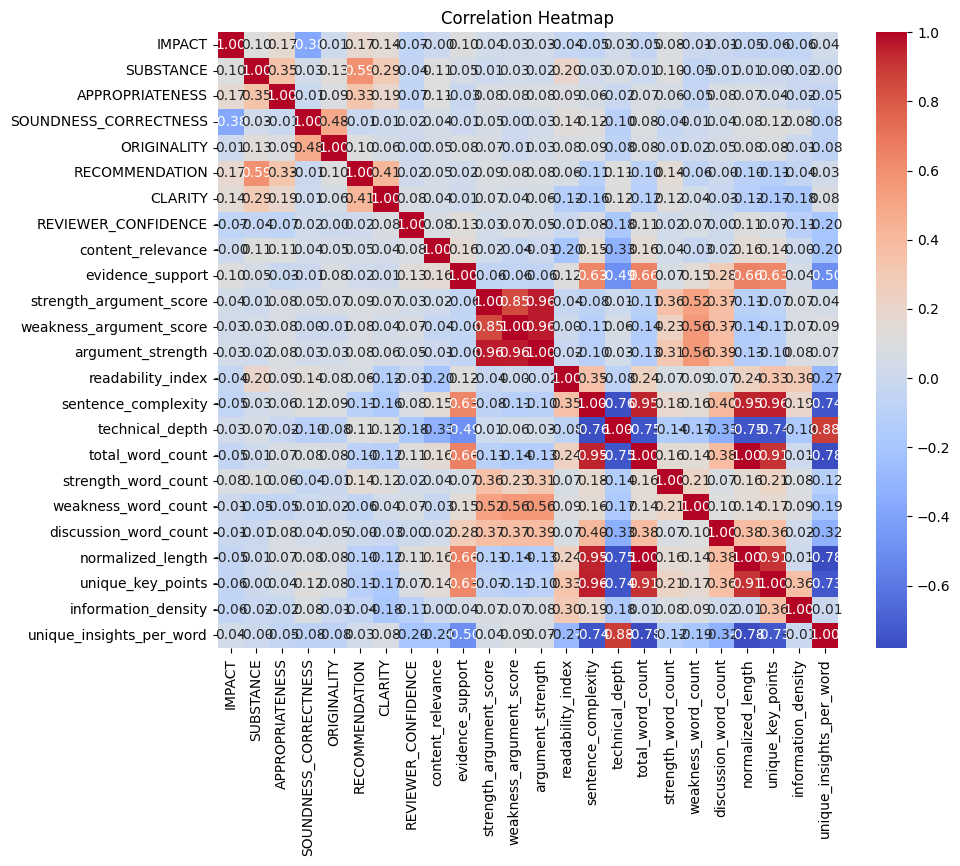

In [82]:
numeric_df = df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

C:\Users\TIRATH BHATHAWALA\AppData\Local\Temp\ipykernel_21424\2039265930.py:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




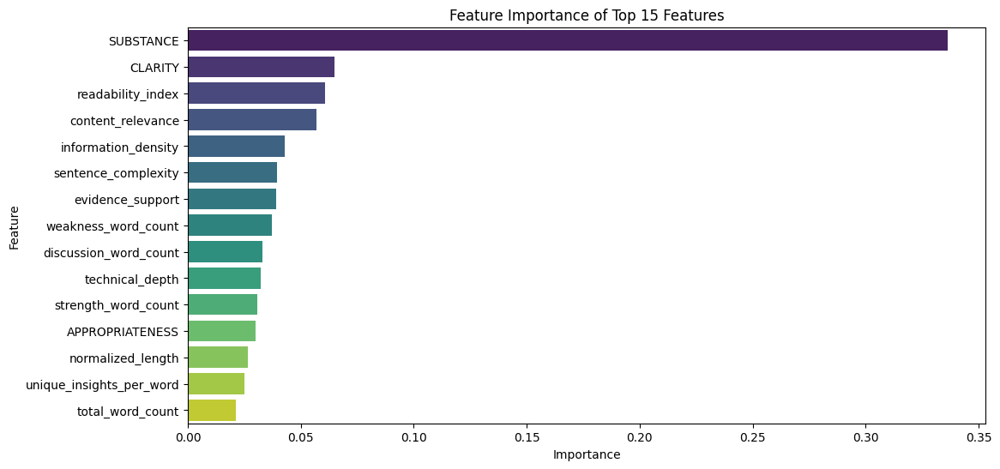

In [125]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(random_state=42)
X = numeric_df.drop(columns=['RECOMMENDATION'])
y = numeric_df['RECOMMENDATION']
model.fit(X, y)

feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance.head(15), palette="viridis")
plt.title("Feature Importance of Top 15 Features")
plt.show()

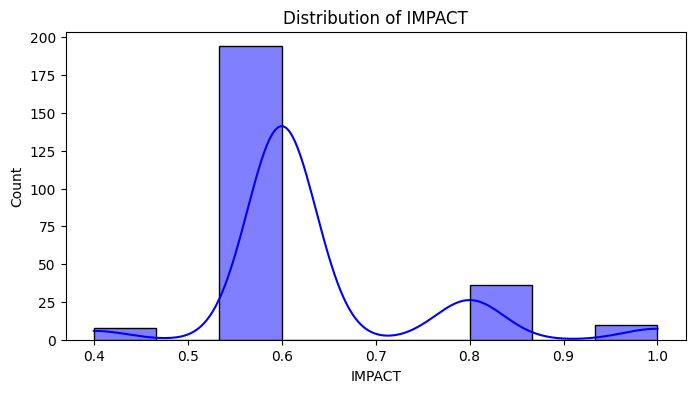

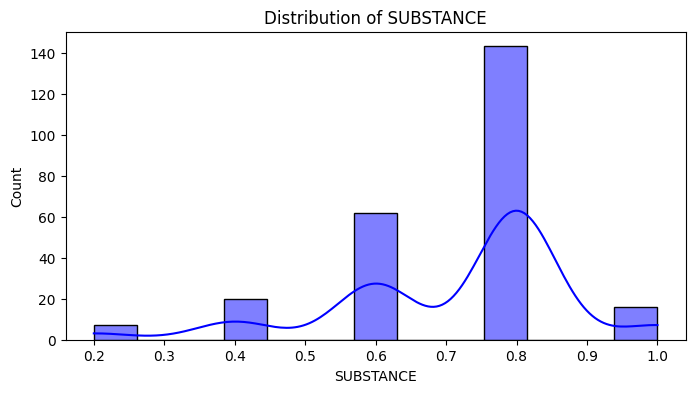

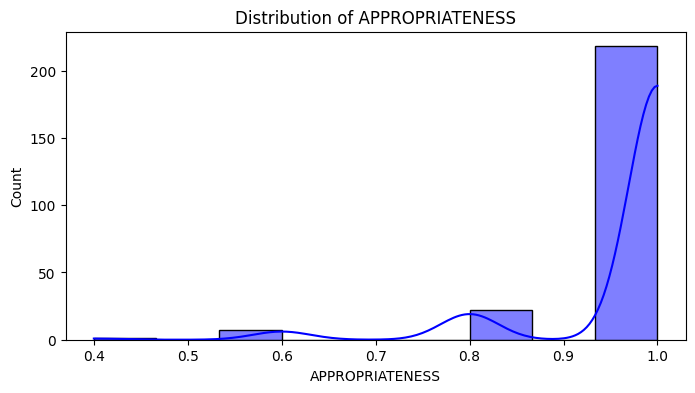

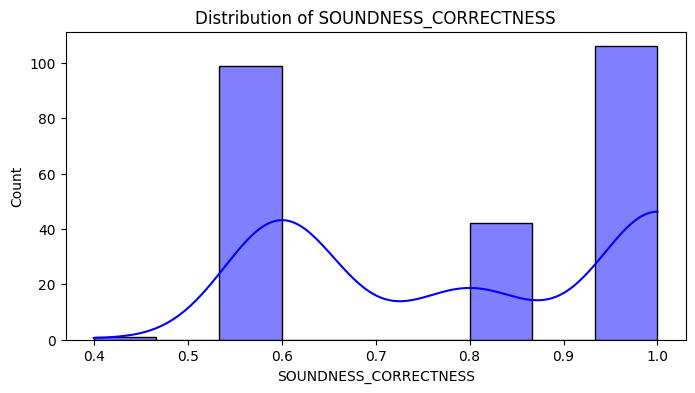

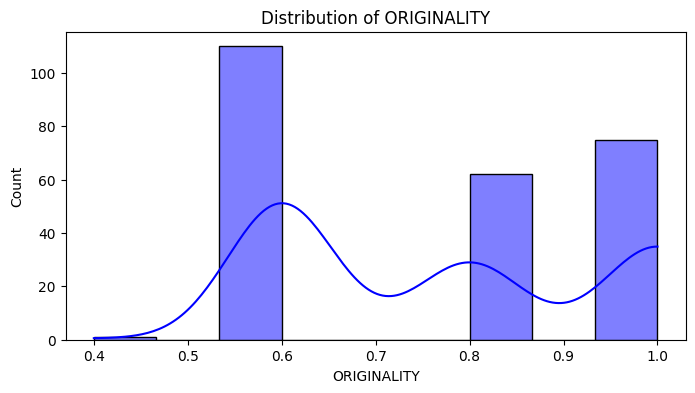

...

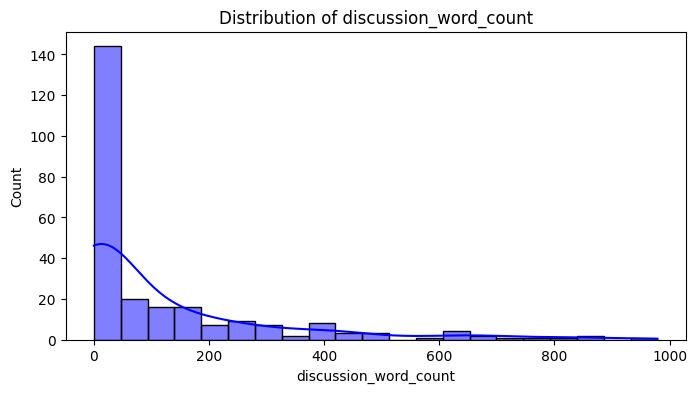

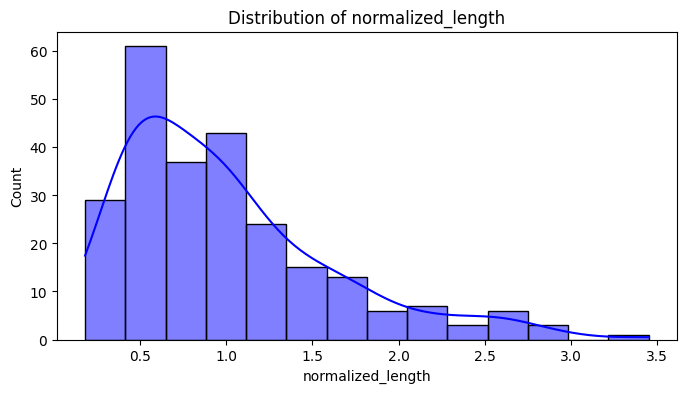

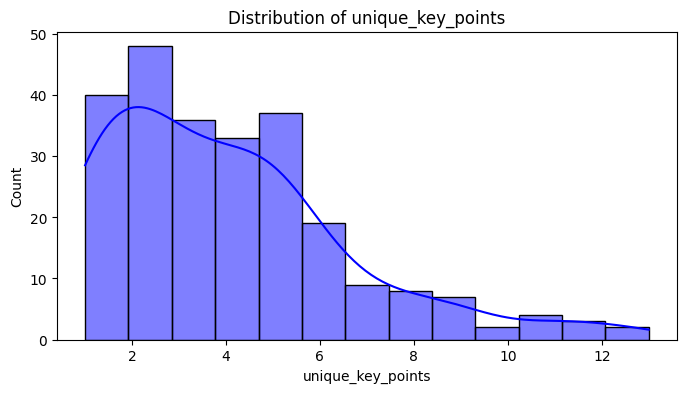

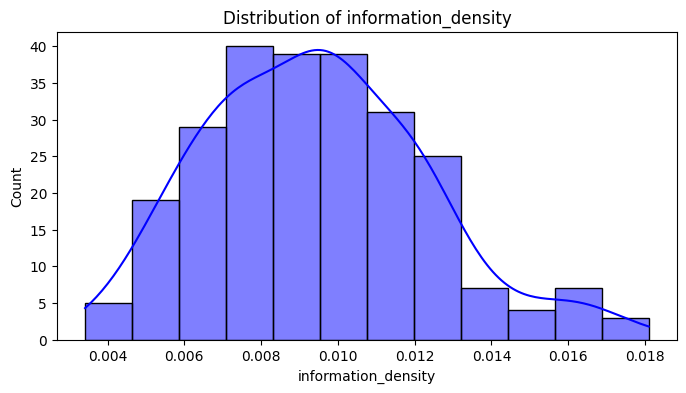

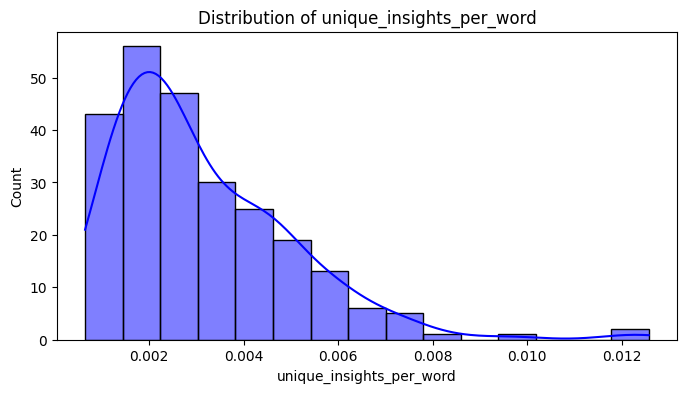

In [113]:
for column in numeric_df.columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(numeric_df[column], kde=True, color='blue')
    plt.title(f"Distribution of {column}")
    plt.show()

## Qualitative Analysis

In [83]:
high_density_reviews = df.nlargest(5, 'information_density')
print("Top 5 Reviews with Highest Information Density:")
print(high_density_reviews[['total_word_count', 'unique_key_points', 'information_density']])

Top 5 Reviews with Highest Information Density:
     total_word_count  unique_key_points  information_density
76                221                  4             0.018100
227               341                  6             0.017595
161               355                  6             0.016901
42                180                  3             0.016667
16                363                  6             0.016529


In [84]:
low_density_reviews = df.nsmallest(5, 'information_density')
print("\nTop 5 Reviews with Lowest Information Density:")
print(low_density_reviews[['total_word_count', 'unique_key_points', 'information_density']])


Top 5 Reviews with Lowest Information Density:
     total_word_count  unique_key_points  information_density
146               293                  1             0.003413
32                274                  1             0.003650
142               268                  1             0.003731
160               251                  1             0.003984
163               467                  2             0.004283


C:\Users\TIRATH BHATHAWALA\AppData\Local\Temp\ipykernel_21424\1358642053.py:6: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap='viridis'), label='Information Density')


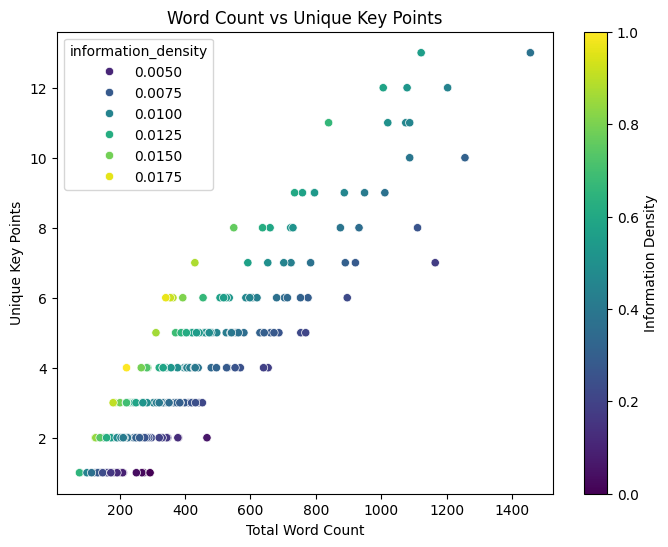

In [85]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='total_word_count', y='unique_key_points', hue='information_density', palette='viridis')
plt.title('Word Count vs Unique Key Points')
plt.xlabel('Total Word Count')
plt.ylabel('Unique Key Points')
plt.colorbar(plt.cm.ScalarMappable(cmap='viridis'), label='Information Density')
plt.show()

In [86]:
strength_avg = df['strength_word_count'].mean()
weakness_avg = df['weakness_word_count'].mean()

print(f"Average Strength Word Count: {strength_avg}")
print(f"Average Weakness Word Count: {weakness_avg}")

Average Strength Word Count: 35.016129032258064
Average Weakness Word Count: 67.00806451612904


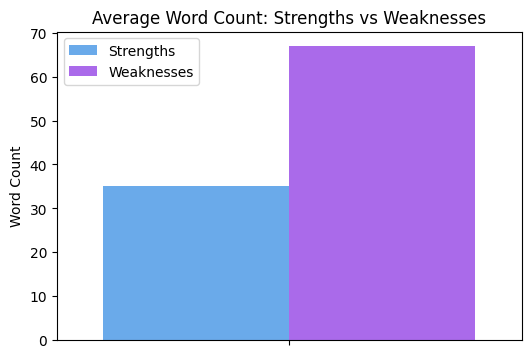

In [123]:
plt.figure(figsize=(6, 4))
sns.barplot(hue=['Strengths', 'Weaknesses'], y=[strength_avg, weakness_avg], palette='cool')
plt.title('Average Word Count: Strengths vs Weaknesses')
plt.ylabel('Word Count')
plt.show()

In [88]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

features = ['total_word_count', 'unique_key_points', 'information_density', 'IMPACT', 'SUBSTANCE']
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

In [89]:
kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster'] = kmeans.fit_predict(scaled_features)

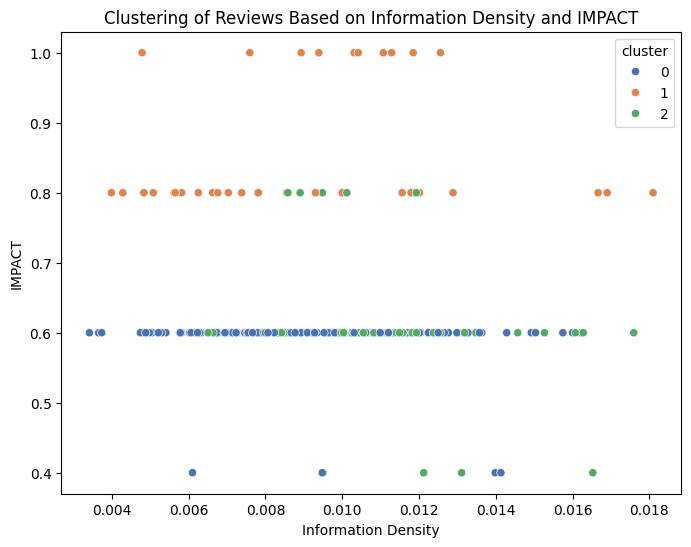

In [90]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='information_density', y='IMPACT', hue='cluster', palette='deep')
plt.title('Clustering of Reviews Based on Information Density and IMPACT')
plt.xlabel('Information Density')
plt.ylabel('IMPACT')
plt.show()

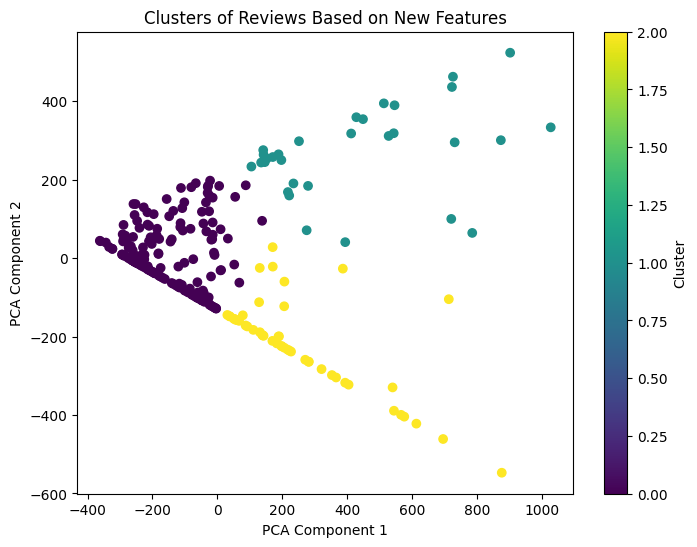

In [114]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

pca = PCA(n_components=2)
reduced_data = pca.fit_transform(numeric_df)

kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(reduced_data)

plt.figure(figsize=(8, 6))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=clusters, cmap='viridis')
plt.title("Clusters of Reviews Based on New Features")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Cluster")
plt.show()

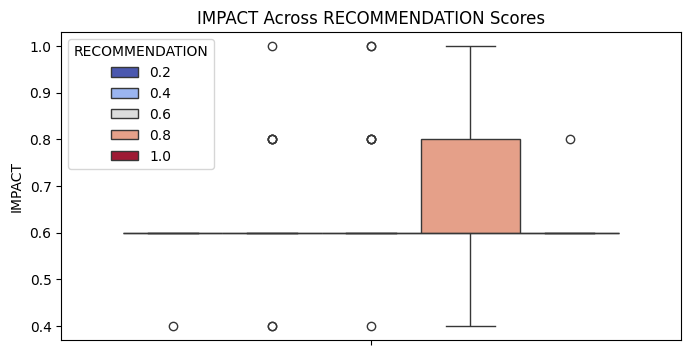

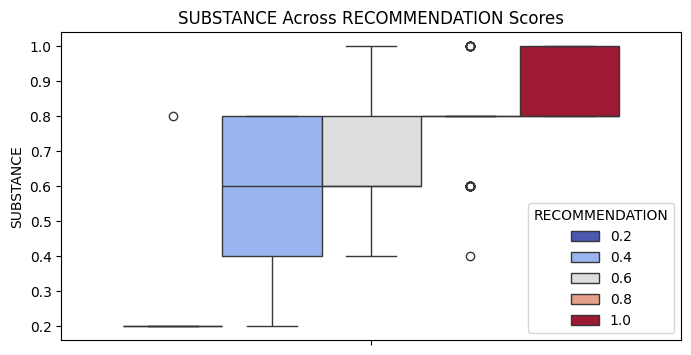

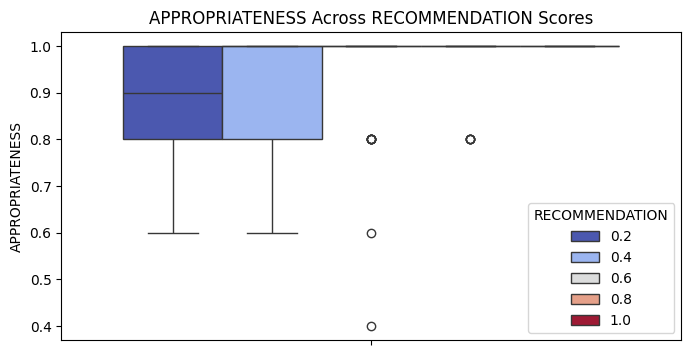

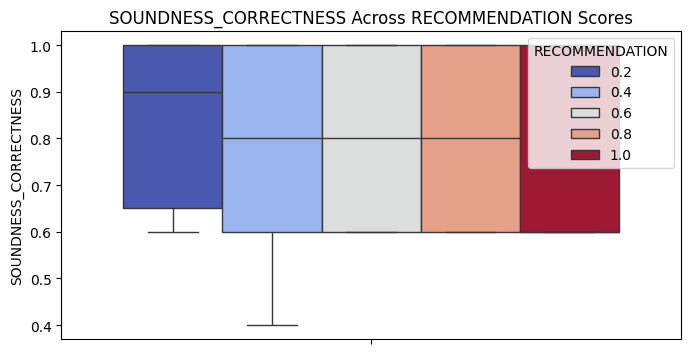

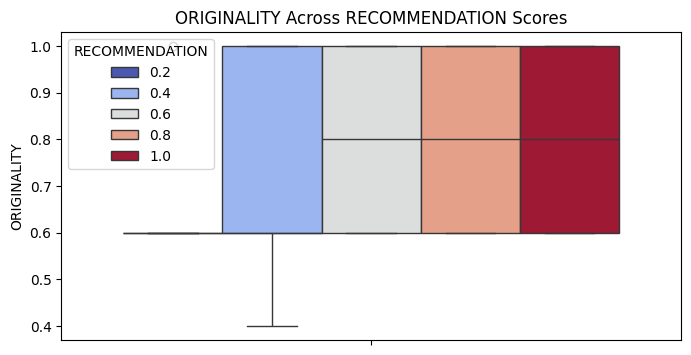

...

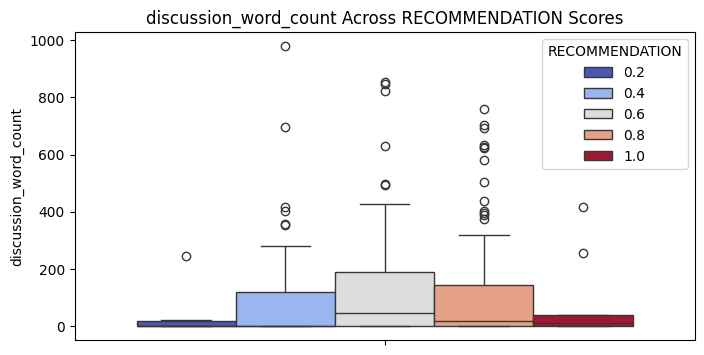

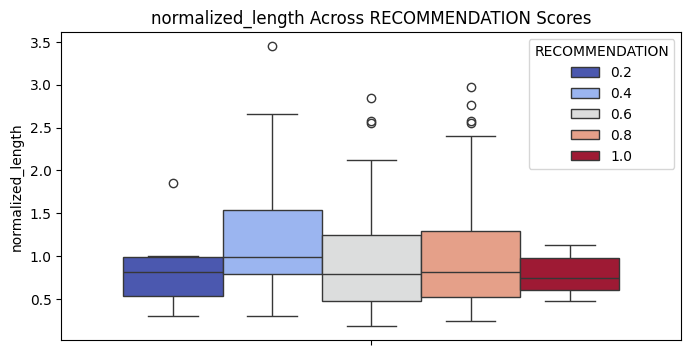

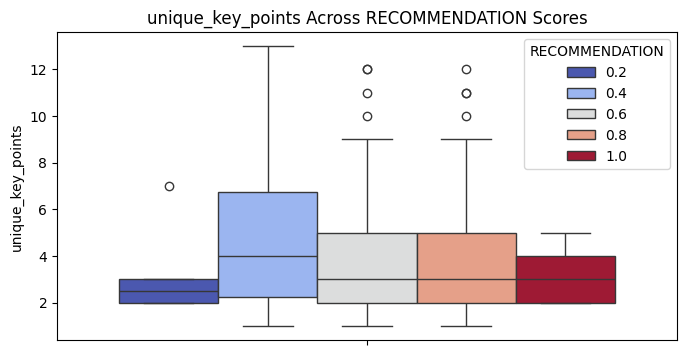

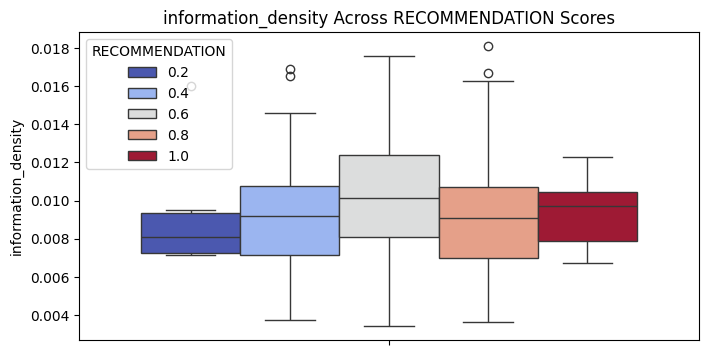

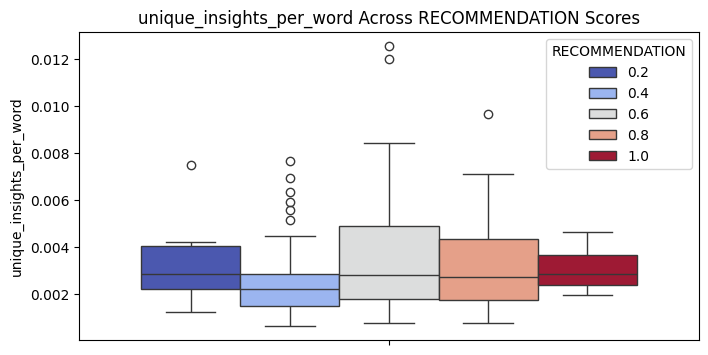

In [116]:
for column in numeric_df.columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(hue=numeric_df['RECOMMENDATION'], y=numeric_df[column], palette="coolwarm")
    plt.title(f"{column} Across RECOMMENDATION Scores")
    plt.show()

In [121]:
outliers = numeric_df[(numeric_df['readability_index'] > numeric_df['readability_index'].quantile(0.95)) |
                      (numeric_df['unique_insights_per_word'] < numeric_df['unique_insights_per_word'].quantile(0.05))]
print(outliers)

     IMPACT  SUBSTANCE  APPROPRIATENESS  SOUNDNESS_CORRECTNESS  ORIGINALITY  \
5       0.6        0.8              1.0                    0.8          0.6   
8       0.6        0.8              1.0                    0.8          0.6   
26      0.6        0.6              1.0                    0.8          0.6   
31      0.6        1.0              1.0                    0.6          0.6   
48      0.6        0.8              1.0                    0.6          0.6   
56      0.6        0.8              1.0                    1.0          1.0   
66      0.6        0.8              1.0                    1.0          1.0   
70      0.6        0.6              1.0                    1.0          0.6   
75      0.8        1.0              1.0                    1.0          1.0   
80      0.6        0.8              1.0                    1.0          1.0   
96      0.6        0.8              1.0                    1.0          1.0   
98      0.6        0.8              1.0             

In [122]:
df.to_csv('../../Datasets/analysis_output.csv', index=False)
print("Analysis outputs saved to 'analysis_output.csv'.")

Analysis outputs saved to 'analysis_output.csv'.


## Various Other Visualizations

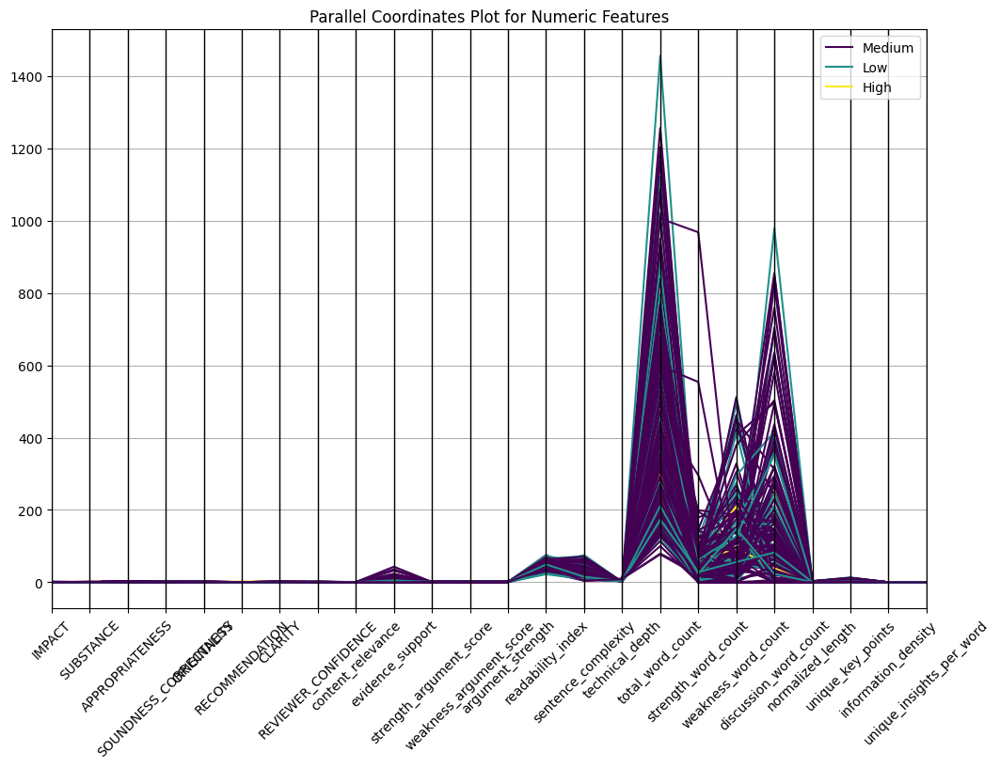

In [92]:
from pandas.plotting import parallel_coordinates

df['recommendation_group'] = pd.cut(df['RECOMMENDATION'], bins=[0, 0.5, 0.8, 1], labels=['Low', 'Medium', 'High'])

plt.figure(figsize=(12, 8))
parallel_coordinates(df, class_column='recommendation_group', cols=numeric_df.columns, colormap=plt.cm.viridis)
plt.title('Parallel Coordinates Plot for Numeric Features')
plt.xticks(rotation=45)
plt.show()

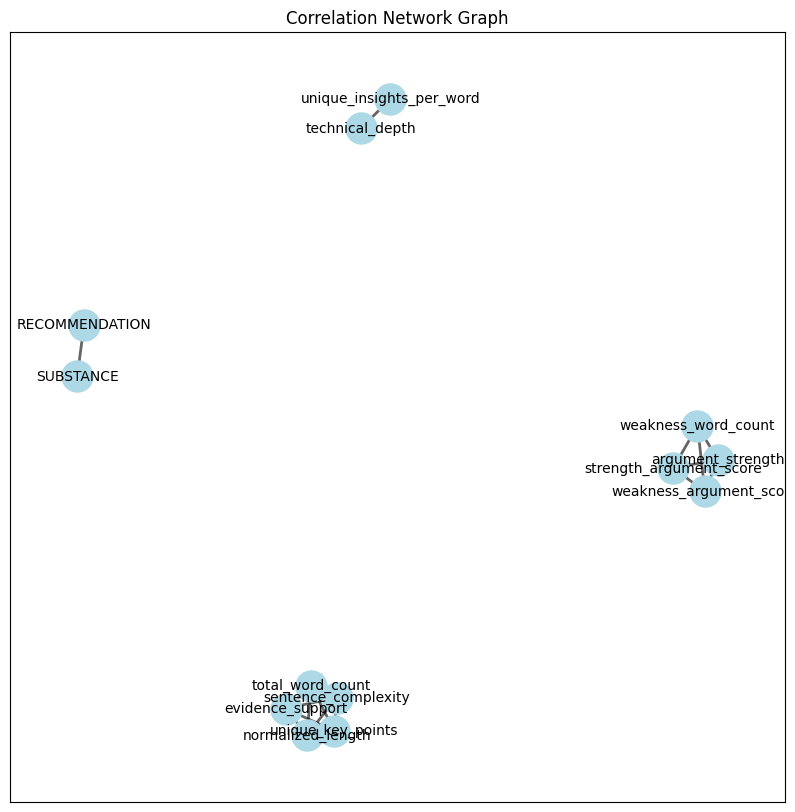

In [94]:
import networkx as nx

threshold = 0.5
correlations = correlation_matrix.stack().reset_index()
correlations.columns = ['Feature1', 'Feature2', 'Correlation']
strong_correlations = correlations[(correlations['Correlation'] > threshold) & (correlations['Feature1'] != correlations['Feature2'])]

G = nx.Graph()
for _, row in strong_correlations.iterrows():
    G.add_edge(row['Feature1'], row['Feature2'], weight=row['Correlation'])

plt.figure(figsize=(10,10))
pos = nx.spring_layout(G, k=0.3)
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
nx.draw_networkx_edges(G, pos, width=2, alpha=0.6)
nx.draw_networkx_labels(G, pos, font_size=10)
plt.title('Correlation Network Graph')
plt.show()

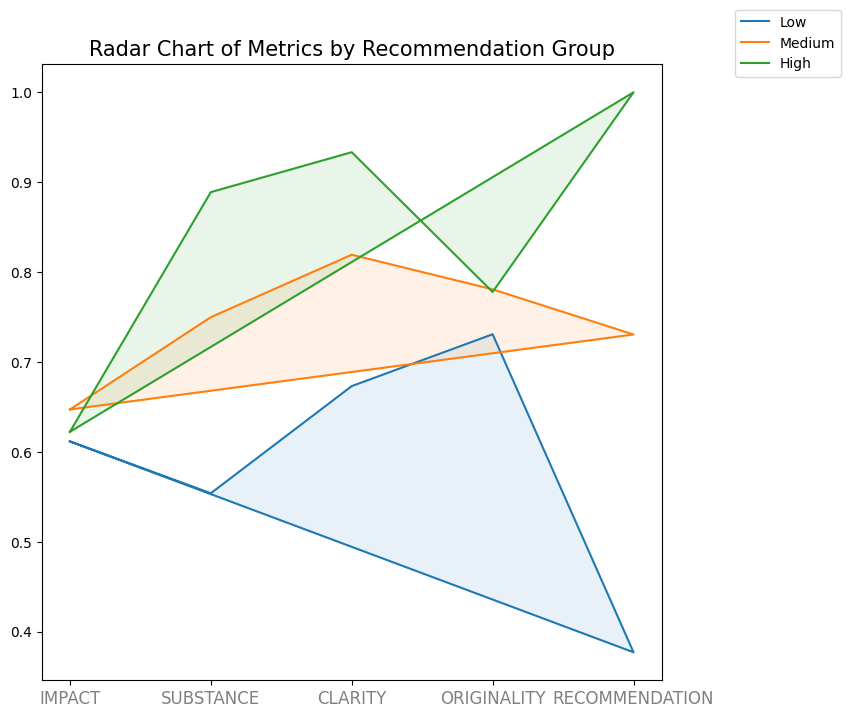

In [95]:
from math import pi

features = ['IMPACT', 'SUBSTANCE', 'CLARITY', 'ORIGINALITY', 'RECOMMENDATION']
grouped = df.groupby('recommendation_group')[features].mean()

categories = list(grouped.columns)
num_vars = len(categories)
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]

plt.figure(figsize=(8, 8))
for group, values in grouped.iterrows():
    values = values.tolist() + values.tolist()[:1]
    plt.plot(angles, values, label=group)
    plt.fill(angles, values, alpha=0.1)

plt.xticks(angles[:-1], categories, color='grey', size=12)
plt.title('Radar Chart of Metrics by Recommendation Group', size=15)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()

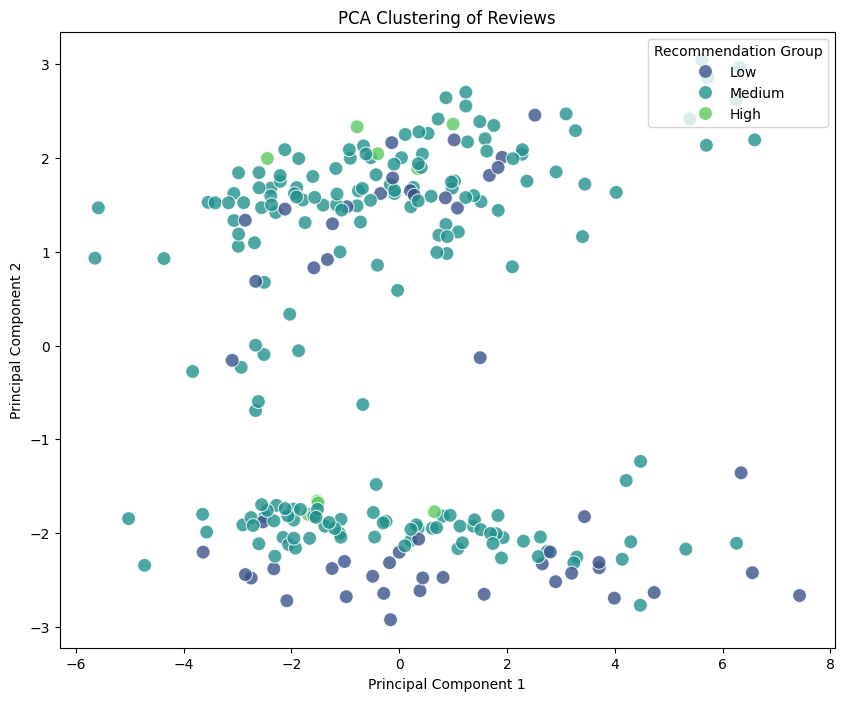

In [96]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaled_data = StandardScaler().fit_transform(numeric_df)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]

plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x='PCA1', y='PCA2', hue='recommendation_group', palette='viridis', s=100, alpha=0.8)
plt.title('PCA Clustering of Reviews')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Recommendation Group', loc='upper right')
plt.show()

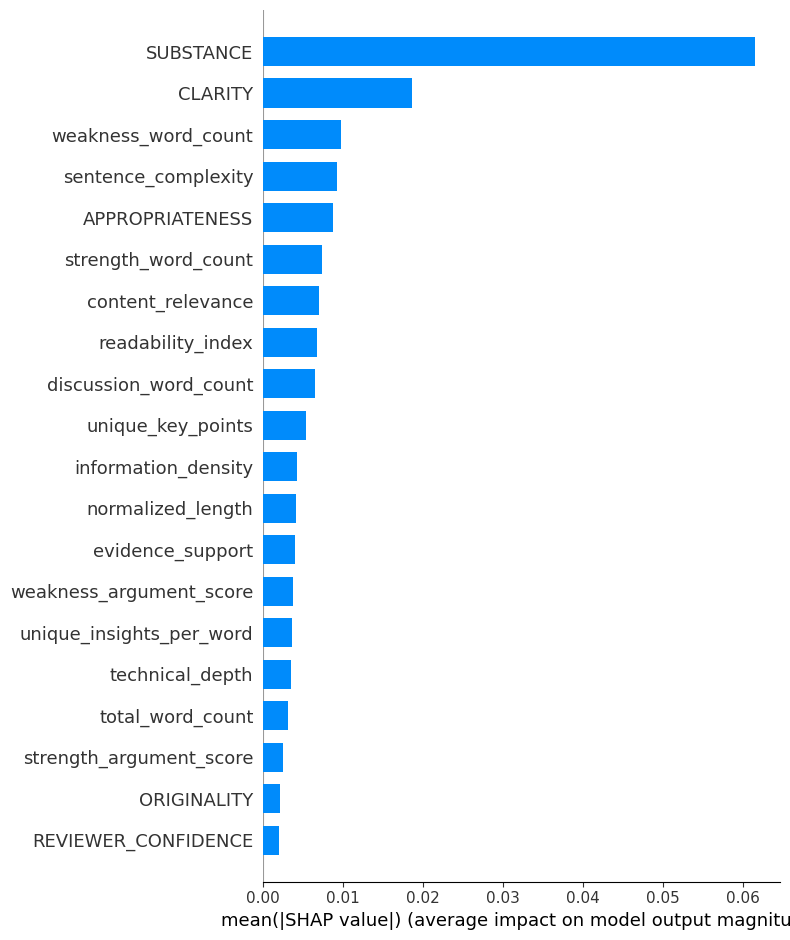

In [97]:
import shap
from sklearn.ensemble import RandomForestRegressor

X = numeric_df.drop(columns=['RECOMMENDATION'])
y = df['RECOMMENDATION']
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

explainer = shap.Explainer(model, X)
shap_values = explainer(X)

shap.summary_plot(shap_values, X, plot_type="bar")

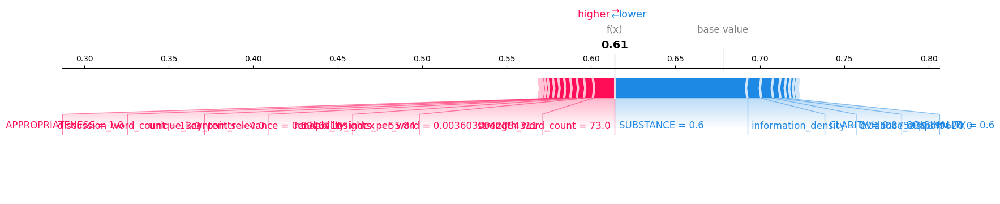

In [98]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

X_sample = shap.sample(X_train, 100) 

explainer = shap.KernelExplainer(model.predict, X_sample)

instance_index = 0  
instance = X_test.iloc[instance_index, :]

shap_values = explainer.shap_values(instance)

shap.force_plot(
    explainer.expected_value,
    shap_values,
    instance,
    matplotlib=True
)

100%|██████████| 50/50 [01:18<00:00,  1.58s/it]


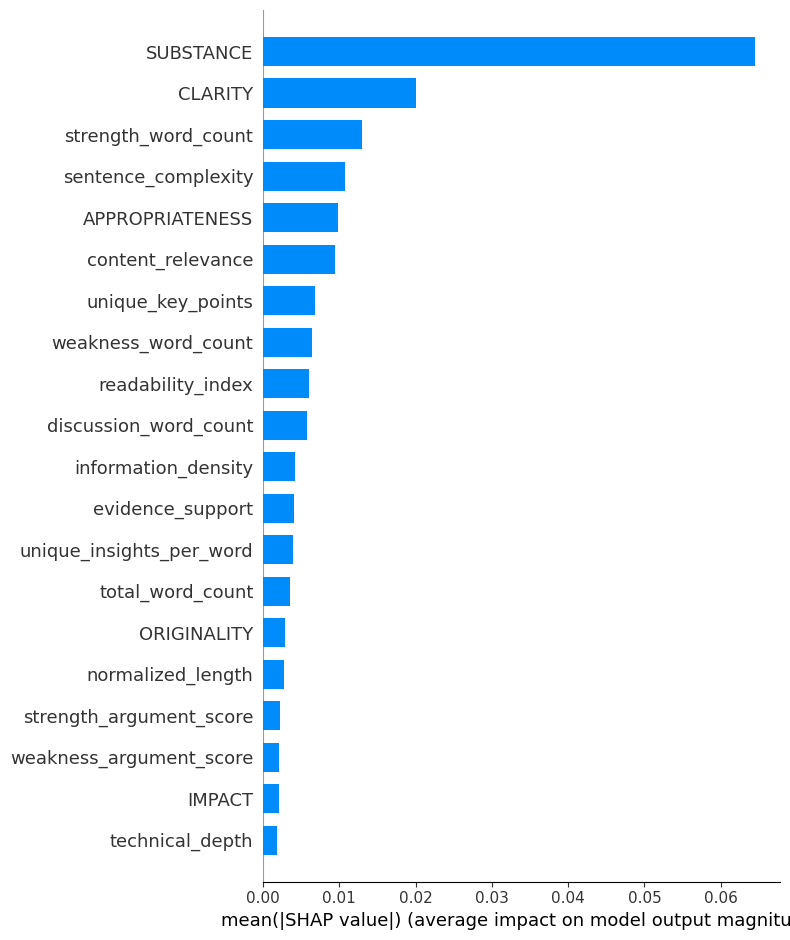

In [101]:
shap_values_global = explainer.shap_values(X_test)
shap.summary_plot(shap_values_global, X_test, plot_type="bar")

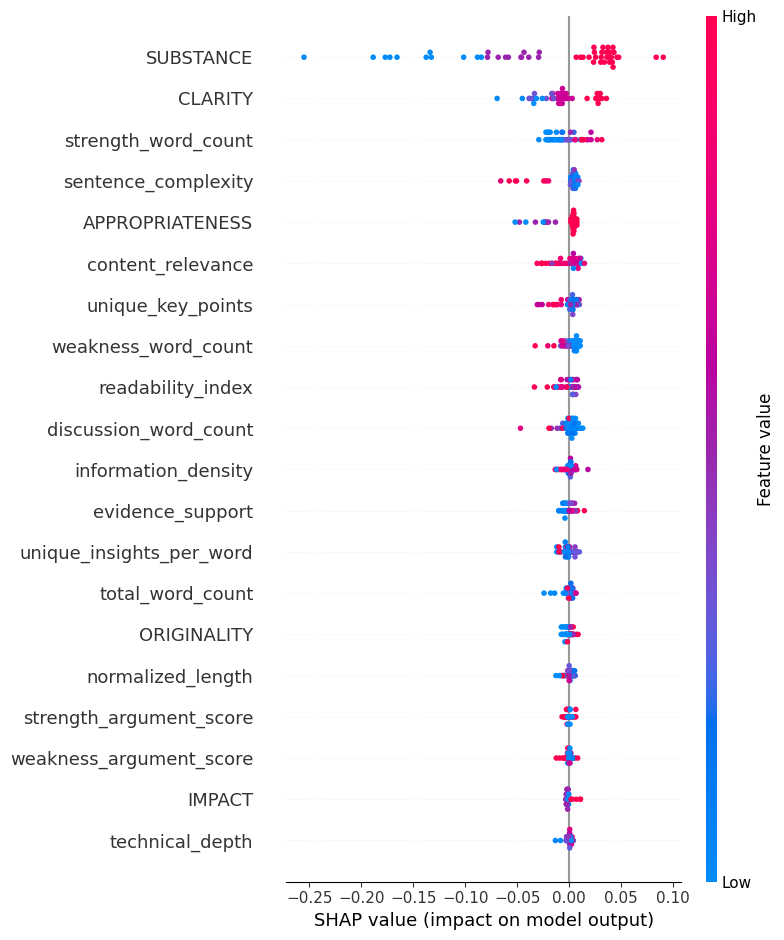

In [102]:
shap.summary_plot(shap_values_global, X_test)

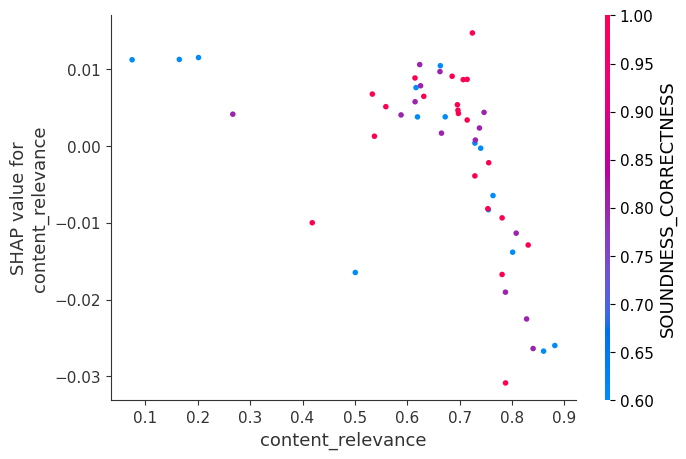

In [103]:
shap.dependence_plot('content_relevance', shap_values_global, X_test)

C:\Users\TIRATH BHATHAWALA\AppData\Local\Temp\ipykernel_21424\2356306361.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Density Cohort', y='RECOMMENDATION', palette='coolwarm')


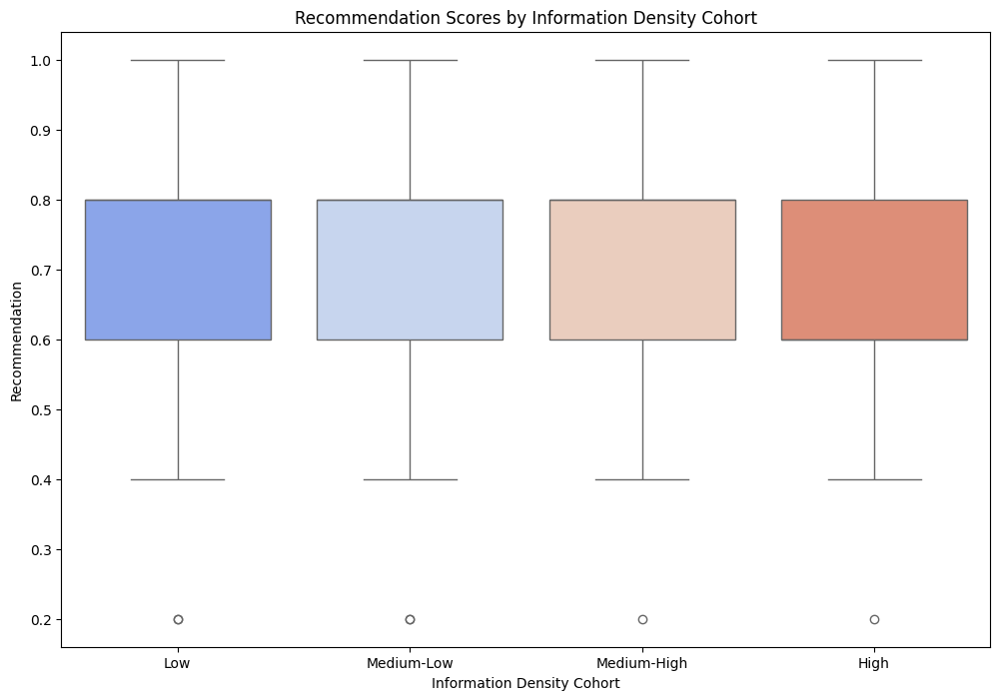

In [107]:
bins = pd.qcut(df['information_density'], q=4, labels=['Low', 'Medium-Low', 'Medium-High', 'High'])
df['Density Cohort'] = bins

plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='Density Cohort', y='RECOMMENDATION', palette='coolwarm')
plt.title('Recommendation Scores by Information Density Cohort')
plt.xlabel('Information Density Cohort')
plt.ylabel('Recommendation')
plt.show()

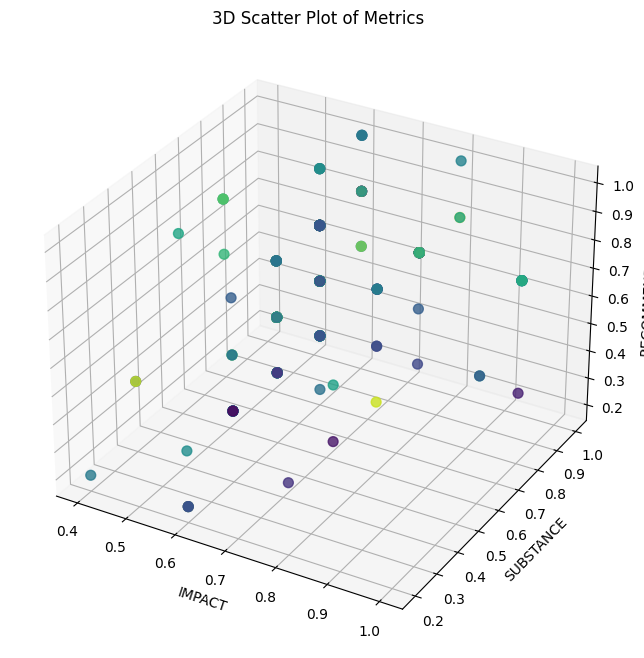

In [108]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['IMPACT'], df['SUBSTANCE'], df['RECOMMENDATION'], c=df['information_density'], cmap='viridis', s=50, alpha=0.8)
ax.set_xlabel('IMPACT')
ax.set_ylabel('SUBSTANCE')
ax.set_zlabel('RECOMMENDATION')
plt.title('3D Scatter Plot of Metrics')
plt.show()

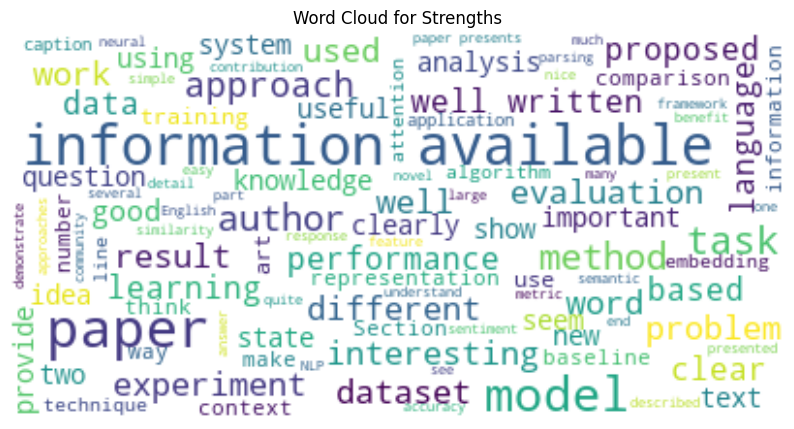

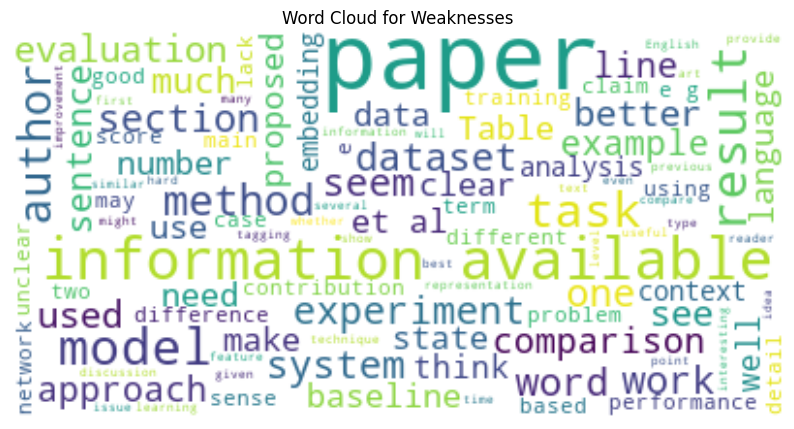

In [109]:
from wordcloud import WordCloud

strength_text = ' '.join(df['strengths'].dropna())
wordcloud_strength = WordCloud(background_color='white', max_words=100).generate(strength_text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_strength, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Strengths')
plt.show()

weakness_text = ' '.join(df['weaknesses'].dropna())
wordcloud_weakness = WordCloud(background_color='white', max_words=100).generate(weakness_text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_weakness, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Weaknesses')
plt.show()

C:\Users\TIRATH BHATHAWALA\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning:

The figure layout has changed to tight



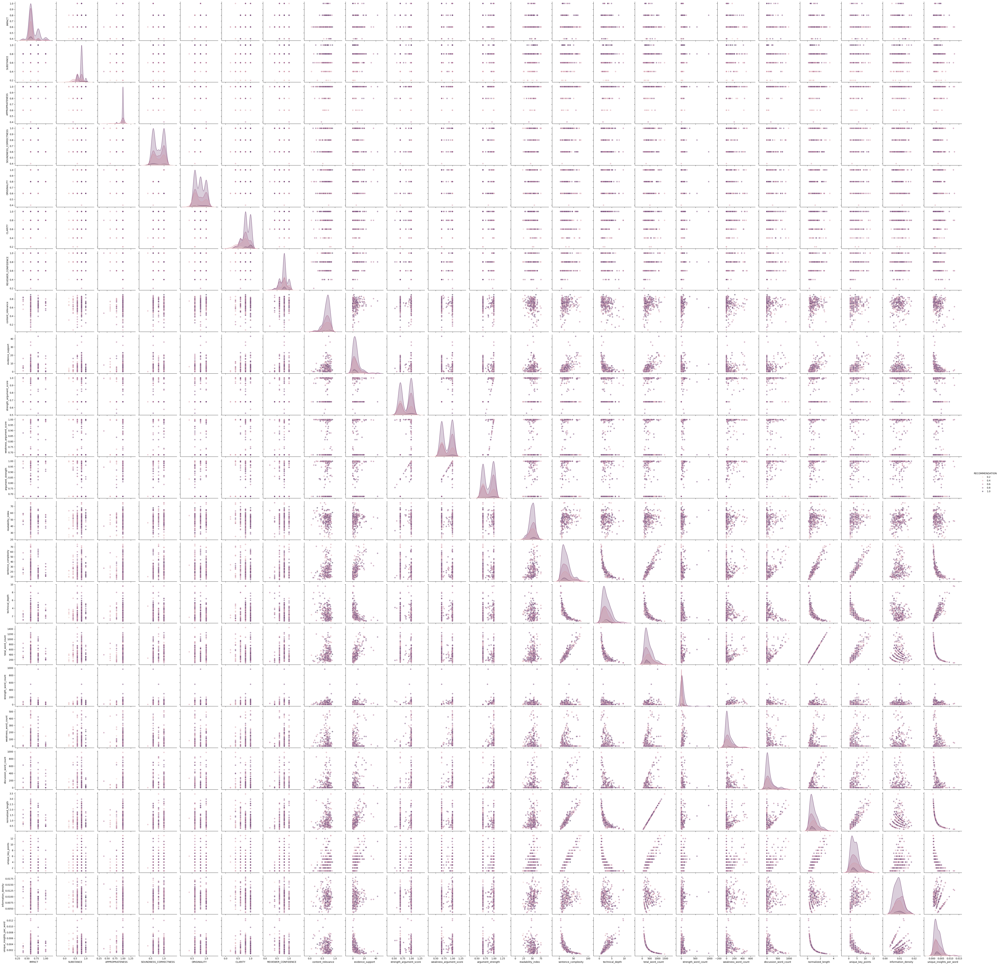

In [127]:
sns.pairplot(numeric_df, hue='RECOMMENDATION', plot_kws={'alpha': 0.5})
plt.show()

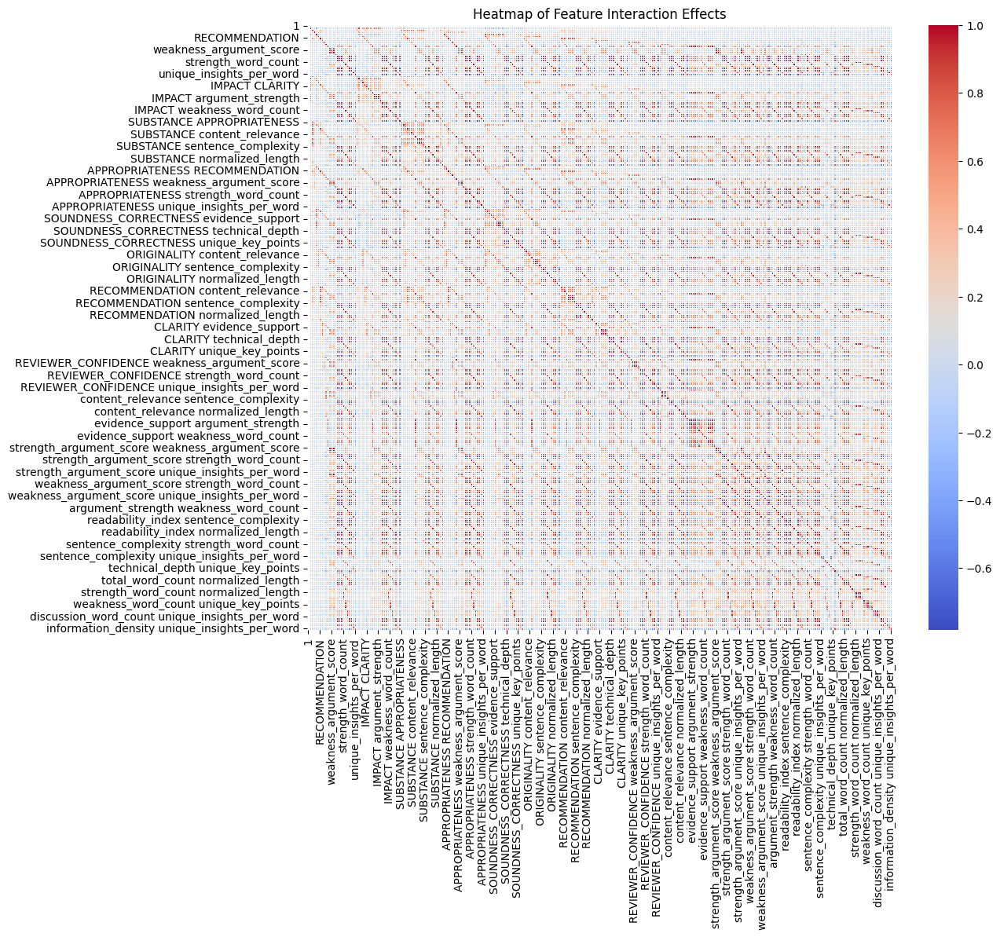

In [129]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True)
interaction_features = poly.fit_transform(numeric_df)

interaction_df = pd.DataFrame(interaction_features, columns=poly.get_feature_names_out(numeric_df.columns))
interaction_corr_matrix = interaction_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(interaction_corr_matrix, annot=False, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap of Feature Interaction Effects")
plt.show()